# Twitter Sentiment Analysis for Guardians of The Galaxy Volume 3

## Chapter 1: Introduction to the Project.

### The aim of this project is to gather opinions about the movie Guardians of The Galaxy Volume 3 from Twitter using an API. I will do so using snscrape.modules.twitter and I will create three dataframes: df_before which will gather opinions from twitter before the premiere of the trailer, df_trailer which will gather opinions between the premiere of the trailer but before the premiere of the movie and df which will consist of only the tweets after the movie's premiere. Next I will preprocess the data using regex techniques, stopwords and lemmatizers. After that I will use two different packages to gather the sentiment: vader's SentimentIntensityAnalyzer and text2emotion. Later I will visualize the results using different kinds of charts. The project is wrapped up with a map displaying labels with the most probable emotion for each tweet which had the coordinates provided. 

In [ ]:
# Importing necessary libraries
import snscrape.modules.twitter as sntwitter
import pandas as pd
import numpy as np
import itertools
import time
import re
import matplotlib.pyplot as plt
import seaborn as sns
import spacy
import nltk
import plotly.express as px
import folium
from multiprocessing.pool import ThreadPool
from datetime import datetime, date, timedelta
from textblob import TextBlob
from wordcloud import WordCloud
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import text2emotion as te

## What is interesting to mention is that this project was built in such a way that it can be easily modified for any other movie. All you have to do is change the search_query and provide the necessary dates below.

In [2]:
# Adjust the search query and dates to any movie.
search_query = '#GotGVol3' # The hashtag we will be using to get the data.
since_when_date = date(2022, 1, 1) # Declaring a start range.
trailer_premiere_date = date(2022, 12, 1) # The date of the trailer's premiere.
movie_premiere_date = date(2023, 5, 5) # The date of the movie's premiere.
until_when_date = datetime.today().strftime('%Y-%m-%d') # Declaring to search for tweets up to today.

In [221]:
day_before_trailer_premiere_date = trailer_premiere_date - timedelta(days = 1) # getting the day before the trailer's premiere
day_before_movie_premiere_date = movie_premiere_date - timedelta(days = 1) # getting the day before the movie's premiere
day_before_movie_premiere_date

datetime.date(2023, 5, 4)

## The run time of the code below is approximately 15-20 minutes long (or maybe I should say short). I chose to only get around 10000 tweets for each df. 

In [4]:
start_time = datetime.now() # Declaring code start time.

# Function to scrape tweets based on search query and date range.
def scrape_tweets(query, start_date=None, end_date=None, max_tweets=10000):
    tweet_list = []
    for tweet in sntwitter.TwitterSearchScraper(query + ' lang:en since:' + start_date + ' until:' + end_date).get_items():
        tweet_list.append(tweet)
        if len(tweet_list) >= max_tweets:
            break
    return tweet_list

# Scrape tweets before the trailer release
print("Scraping tweets before trailer release...")
with ThreadPool(processes=1) as pool:
    tweets_before_trailer = pool.apply(scrape_tweets, (search_query, str(since_when_date), str(day_before_trailer_premiere_date), 10000))
print(f"Number of tweets before trailer: {len(tweets_before_trailer)}")

# Scrape tweets after the trailer release but before the movie premiere
print("Scraping tweets after trailer release but before movie premiere...")
with ThreadPool(processes=1) as pool:
    tweets_after_trailer = pool.apply(scrape_tweets, (search_query, str(trailer_premiere_date), str(day_before_movie_premiere_date), 10000))
print(f"Number of tweets after trailer but before premiere: {len(tweets_after_trailer)}")

# Scrape tweets after the movie premiere
print("Scraping tweets after movie premiere...")
with ThreadPool(processes=1) as pool:
    tweets_after_premiere = pool.apply(scrape_tweets, (search_query, str(movie_premiere_date), str(until_when_date), 10000))
print(f"Number of tweets after premiere: {len(tweets_after_premiere)}")

end_time = datetime.now()
# Printing the time duration for scraping these tweets
print('Duration: {}'.format(end_time - start_time))

Scraping tweets before trailer release...


Twitter responded with an error: TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecif

Twitter responded with an error: TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecif

Number of tweets before trailer: 3149
Scraping tweets after trailer release but before movie premiere...


Twitter responded with an error: TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecif

Number of tweets after trailer but before premiere: 1603
Scraping tweets after movie premiere...


Twitter responded with an error: TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecif

Twitter responded with an error: TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecif

Could not translate t.co card URL on tweet 1656470389533339650
Twitter responded with an error: TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, Time

Twitter responded with an error: TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecif

Twitter responded with an error: TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecified, TimeoutError: Timeout: Unspecif

Number of tweets after premiere: 10000
Duration: 0:15:22.579861


### As we can see it was a good move to set the tweet amount to 10000 because for the first two df's we only get 3149 and 1603 rows of data but after the premiere we reached the limit of 10000 rows of data. It is interesting to notice that people tweeted more about the movie before its trailer had premiered than after its premiere. 

In [163]:
# Creating the df_before. Let's take out only the 'date', 'coordinates' and 'renderedContent' columns. 
tweets_before_trailer = pd.DataFrame(tweets_before_trailer)
df_before = tweets_before_trailer[['date', 'coordinates', 'renderedContent']]
df_before = df_before.rename(columns = {'renderedContent':'Tweets'})
df_before['date'] = df_before['date'].dt.date # Switching to date format as we we don't really need the hours and the timezone.
df_before.head(10) # Presenting  first 10 rows of data.

,date,coordinates,Tweets
0,2022-11-29,None,gotg vol3 e barbie&gt;&gt;&gt;&gt;&gt;&gt;&gt;...
1,2022-11-29,None,The #GuardiansoftheGalaxyHolidaySpecial is gon...
2,2022-11-29,None,Not bad for a girl from Queens at all! 🤯 #Avat...
3,2022-11-29,"{'longitude': -95.414773, 'latitude': 32.221406}",Facts 😭 GotG vol3 is supposed to be dark
4,2022-11-29,None,🥺 I’m not emotional ready for #GotGVol3
5,2022-11-28,None,@MCU_Direct 8.8 #GuardiansOfTheGalaxyHolidaySp...
6,2022-11-28,None,James Gunn debunks a claim that #Groot will be...
7,2022-11-28,None,@Shanyshdw GOTG VOL3 GONNA BE SO GOOD\ni am go...
8,2022-11-28,None,P.s. Its gonna be so hard watching #gotgvol3 a...
9,2022-11-28,None,@JamesGunn thank you and everyone for the #Got...


### We can see that there are a lot of emojis to be deleted later on. Also, unfortunately it most of the tweets don't have the coordinates of their lcoation provided.

In [164]:
# Same as above.
tweets_after_trailer = pd.DataFrame(tweets_after_trailer)
df_trailer = tweets_after_trailer[['date', 'coordinates', 'renderedContent']]
df_trailer = df_trailer.rename(columns = {'renderedContent':'Tweets'})
df_trailer['date'] = df_trailer['date'].dt.date
df_trailer.head(10)

,date,coordinates,Tweets
0,2023-05-03,None,Especially for an okay film 😐 #GotGVol3
1,2023-05-03,None,Perfect #gotgvol3 Premiere!! Honor to enjoy w/...
2,2023-05-03,None,Press screening of #GotGVol3 🦝 https://t.co/IZ...
3,2023-05-03,None,When you have to watch #GotGVol3 in #3D on #3r...
4,2023-05-03,None,#GuardiansOfTheGalaxyVol3 press screening #Got...
5,2023-05-03,None,Marvel: He. Is. Groot. 🌳 @VinDiesel reveals Gr...
6,2023-05-03,None,Seeing Guardians of the galaxy volume 3 #gotgv...
7,2023-05-03,None,Lofi Studying Rocket Raccoon (WIP)\n#rocketra...
8,2023-05-03,None,Pregaming for #GotGVol3 tomorrow… starting wit...
9,2023-05-03,None,just came home from the movies \ni watched got...


In [165]:
# Same as above.
tweets_after_premiere = pd.DataFrame(tweets_after_premiere)
df = tweets_after_premiere[['date', 'coordinates', 'renderedContent']]
df = df.rename(columns = {'renderedContent':'Tweets'})
df['date'] = df['date'].dt.date
df.head(10)

,date,coordinates,Tweets
0,2023-05-31,None,Actually I really loved the movies to the poin...
1,2023-05-31,None,@H00KFANGS They are keeping too many secrets I...
2,2023-05-31,None,One thing I’ve noticed as of late is anyone in...
3,2023-05-31,None,Gotg vol3 isn't crazy it's good yeah and I lov...
4,2023-05-31,None,Grab your @Microsoft Zune and listen to music ...
5,2023-05-31,None,Cosmo the space dog from Guardians of the Gala...
6,2023-05-31,None,#Thanos and #AdamWarlock…comics vs MCU. \n✨\n#...
7,2023-05-31,None,Time to WATCH our latest issue so join me @the...
8,2023-05-31,None,Disney's Guardians of the Galaxy Vol. 3 grosse...
9,2023-05-31,None,funfact abt me: Im a fan of gotg! My fav chara...


## Chapter 2: Preprocessing the tweets.

### Let's do some cleaning. I will start off with removing any mentiones, hashtags, url's, new lines and non-words. Next I will tokenize the text, filter for stop words and use lemmatisation.

In [167]:
# clean the tweets with a function
def cleanTweets(text):
    text = re.sub('@[A-Za-z0-9_]+', '', text) #removes @mentions
    text = re.sub('#','',text) #removes hashtag '#' symbol
    text = re.sub('RT[\s]+','',text) # remove the RT (retweet) indicators
    text = re.sub('https?:\/\/\S+', '', text) # remove any URLs
    text = re.sub('\n',' ',text) # replace all newline characters in the text string with a space character
    text = re.sub(r'[^\w\s]', '', text) #  remove any non-word characters and non-whitespace characters from the text string
    return text

# apply cleanTweets function to the tweets
df_before['cleanedTweets'] = df_before['Tweets'].apply(cleanTweets)
df_trailer['cleanedTweets'] = df_trailer['Tweets'].apply(cleanTweets)
df['cleanedTweets'] = df['Tweets'].apply(cleanTweets) 
df.head(5) # compares original tweets with cleaned Tweets

,date,coordinates,Tweets,cleanedTweets
0,2023-05-31,None,Actually I really loved the movies to the poin...,Actually I really loved the movies to the poin...
1,2023-05-31,None,@H00KFANGS They are keeping too many secrets I...,They are keeping too many secrets I need them...
2,2023-05-31,None,One thing I’ve noticed as of late is anyone in...,One thing Ive noticed as of late is anyone inv...
3,2023-05-31,None,Gotg vol3 isn't crazy it's good yeah and I lov...,Gotg vol3 isnt crazy its good yeah and I love ...
4,2023-05-31,None,Grab your @Microsoft Zune and listen to music ...,Grab your Zune and listen to music from The ...


### It seems our cleaned tweets look much better now. Let's dive in a bit more and tokenize the text, filter for stopwords and use the WordNetLemmatizer().

In [168]:
# create preprocess_text function
def preprocess_text(text):
    # Tokenize the text
    tokens = word_tokenize(text.lower())

    # Remove stop words
    filtered_tokens = [token for token in tokens if token not in stopwords.words('english')]

    # Lemmatize the tokens
    lemmatizer = WordNetLemmatizer()
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in filtered_tokens]

    # Join the tokens back into a string
    processed_text = ' '.join(lemmatized_tokens)
    return processed_text

# apply the function df
df_before['reviewText'] = df_before['cleanedTweets'].apply(preprocess_text)
df_trailer['reviewText'] = df_trailer['cleanedTweets'].apply(preprocess_text)
df['reviewText'] = df['cleanedTweets'].apply(preprocess_text)
df.head(5)

,date,coordinates,Tweets,cleanedTweets,reviewText
0,2023-05-31,None,Actually I really loved the movies to the poin...,Actually I really loved the movies to the poin...,actually really loved movie point one planned ...
1,2023-05-31,None,@H00KFANGS They are keeping too many secrets I...,They are keeping too many secrets I need them...,keeping many secret need reveal
2,2023-05-31,None,One thing I’ve noticed as of late is anyone in...,One thing Ive noticed as of late is anyone inv...,one thing ive noticed late anyone invited pre ...
3,2023-05-31,None,Gotg vol3 isn't crazy it's good yeah and I lov...,Gotg vol3 isnt crazy its good yeah and I love ...,gotg vol3 isnt crazy good yeah love james gunn...
4,2023-05-31,None,Grab your @Microsoft Zune and listen to music ...,Grab your Zune and listen to music from The ...,grab zune listen music galaxy official mixtape...


### As you can see above the reviewText doesn't have any stopwords or capital letters. Moreover, we used the lemmatization technique which is the process of grouping together the inflected forms of a word so they can be analysed as a single item, identified by the word's lemma. For example the word 'better' will be changed to 'good'.

## Chapter 3: Sentiment analysis.

### In this chapter I will use two different packages for sentiment analysis. I will begin with NLTK's vader SentimentIntensityAnalyzer().

In [171]:
# initialize NLTK sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# create get_sentiment function
def get_sentiment_vader(text):
    scores = analyzer.polarity_scores(text) # get the score.
    sentiment = 1 if scores['compound'] > 0.05 else (-1 if scores['compound'] < -0.05 else 0) 
    # classifying the scores as positive opinions (1), neutral (0) and negative (-1).
    return sentiment

# apply get_sentiment_vader function
df_before['sentiment_vader'] = df_before['reviewText'].apply(get_sentiment_vader)
df_trailer['sentiment_vader'] = df_trailer['reviewText'].apply(get_sentiment_vader)
df['sentiment_vader'] = df['reviewText'].apply(get_sentiment_vader)
df_trailer.head(5)

,date,coordinates,Tweets,cleanedTweets,reviewText,sentiment_vader
0,2023-05-03,None,Especially for an okay film 😐 #GotGVol3,Especially for an okay film GotGVol3,especially okay film gotgvol3,1
1,2023-05-03,None,Perfect #gotgvol3 Premiere!! Honor to enjoy w/...,Perfect gotgvol3 Premiere Honor to enjoy w the...,perfect gotgvol3 premiere honor enjoy w cofoun...,1
2,2023-05-03,None,Press screening of #GotGVol3 🦝 https://t.co/IZ...,Press screening of GotGVol3,press screening gotgvol3,0
3,2023-05-03,None,When you have to watch #GotGVol3 in #3D on #3r...,When you have to watch GotGVol3 in 3D on 3rdMa...,watch gotgvol3 3d 3rdmay wonderful day,1
4,2023-05-03,None,#GuardiansOfTheGalaxyVol3 press screening #Got...,GuardiansOfTheGalaxyVol3 press screening GotGV...,guardiansofthegalaxyvol3 press screening gotgvol3,0


## As you can see in the sample data I have classified the tweets into positive, neutral and negative opinions. Let's look into this a bit more. The text2emotion package enables us to see the true emotions behind the tweets.

In [172]:
# create get_sentiment_te function
def get_sentiment_te(text):
    scores = te.get_emotion(text)
    return scores

# apply get_sentiment vader function
df_before['sentiment_te'] = df_before['reviewText'].apply(get_sentiment_te)
df_trailer['sentiment_te'] = df_trailer['reviewText'].apply(get_sentiment_te)
df['sentiment_te'] = df['reviewText'].apply(get_sentiment_te)
df.head(10)

,date,coordinates,Tweets,cleanedTweets,reviewText,sentiment_vader,sentiment_te
0,2023-05-31,None,Actually I really loved the movies to the poin...,Actually I really loved the movies to the poin...,actually really loved movie point one planned ...,1,"{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.29..."
1,2023-05-31,None,@H00KFANGS They are keeping too many secrets I...,They are keeping too many secrets I need them...,keeping many secret need reveal,0,"{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, ..."
2,2023-05-31,None,One thing I’ve noticed as of late is anyone in...,One thing Ive noticed as of late is anyone inv...,one thing ive noticed late anyone invited pre ...,1,"{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, ..."
3,2023-05-31,None,Gotg vol3 isn't crazy it's good yeah and I lov...,Gotg vol3 isnt crazy its good yeah and I love ...,gotg vol3 isnt crazy good yeah love james gunn...,1,"{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, ..."
4,2023-05-31,None,Grab your @Microsoft Zune and listen to music ...,Grab your Zune and listen to music from The ...,grab zune listen music galaxy official mixtape...,1,"{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, ..."
5,2023-05-31,None,Cosmo the space dog from Guardians of the Gala...,Cosmo the space dog from Guardians of the Gala...,cosmo space dog guardian galaxy vol3 gotgvol3 ...,0,"{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad':..."
6,2023-05-31,None,#Thanos and #AdamWarlock…comics vs MCU. \n✨\n#...,Thanos and AdamWarlockcomics vs MCU Marvel M...,thanos adamwarlockcomics v mcu marvel marvelco...,1,"{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, ..."
7,2023-05-31,None,Time to WATCH our latest issue so join me @the...,Time to WATCH our latest issue so join me am...,time watch latest issue join amp speak hot top...,1,"{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.33,..."
8,2023-05-31,None,Disney's Guardians of the Galaxy Vol. 3 grosse...,Disneys Guardians of the Galaxy Vol 3 grossed ...,disney guardian galaxy vol 3 grossed 255m tues...,-1,"{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, ..."
9,2023-05-31,None,funfact abt me: Im a fan of gotg! My fav chara...,funfact abt me Im a fan of gotg My fav chara i...,funfact abt im fan gotg fav chara mantisgotgvo...,1,"{'Happy': 0, 'Angry': 0, 'Surprise': 0, 'Sad':..."


## As we can't see much let's create new columns Happy, Angry, Surprise, Sad and Fear with their corresponding values.

In [173]:
df_before = pd.concat([df_before, pd.DataFrame(df_before['sentiment_te'].to_list())], axis = 1)
df_trailer = pd.concat([df_trailer, pd.DataFrame(df_trailer['sentiment_te'].to_list())], axis = 1)
df = pd.concat([df, pd.DataFrame(df['sentiment_te'].to_list())], axis = 1)
df.head(5)

,date,coordinates,Tweets,cleanedTweets,reviewText,sentiment_vader,sentiment_te,Happy,Angry,Surprise,Sad,Fear
0,2023-05-31,None,Actually I really loved the movies to the poin...,Actually I really loved the movies to the poin...,actually really loved movie point one planned ...,1,"{'Happy': 0.14, 'Angry': 0.0, 'Surprise': 0.29...",0.14,0.0,0.29,0.43,0.14
1,2023-05-31,None,@H00KFANGS They are keeping too many secrets I...,They are keeping too many secrets I need them...,keeping many secret need reveal,0,"{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 1.0, ...",0.00,0.0,1.00,0.00,0.00
2,2023-05-31,None,One thing I’ve noticed as of late is anyone in...,One thing Ive noticed as of late is anyone inv...,one thing ive noticed late anyone invited pre ...,1,"{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, ...",0.00,0.0,0.00,0.29,0.71
3,2023-05-31,None,Gotg vol3 isn't crazy it's good yeah and I lov...,Gotg vol3 isnt crazy its good yeah and I love ...,gotg vol3 isnt crazy good yeah love james gunn...,1,"{'Happy': 0.5, 'Angry': 0.0, 'Surprise': 0.0, ...",0.50,0.0,0.00,0.00,0.50
4,2023-05-31,None,Grab your @Microsoft Zune and listen to music ...,Grab your Zune and listen to music from The ...,grab zune listen music galaxy official mixtape...,1,"{'Happy': 0.0, 'Angry': 0.0, 'Surprise': 0.0, ...",0.00,0.0,0.00,0.00,1.00


### Wow at first sight we can see some interesting things. The first tweet above was classified as positive using vader however text2emotion gave it a score of 0.43 for Sad. As a fan of the movie I know what this means. Without any spoilers the movie is really good however there is a lot of sadness in it.

# Chapter 4: Visualising the data.

## Inside of this chapter you will find many interesting plots. For the purpose of this chapter we will assume that vader's classification as to whether or not the tweets were positive, neutral or negative are correct. It would be better to have a dataset which would have a column with the real opinion but as we do not have it let's just use what we have.

In [174]:
total_emotions_before = df_before[['Happy', 'Angry', 'Surprise', 'Sad', 'Fear','sentiment_vader']].groupby('sentiment_vader').sum()
mean_emotions_before = df_before[['Happy', 'Angry', 'Surprise', 'Sad', 'Fear','sentiment_vader']].groupby('sentiment_vader').mean()

total_emotions_trailer = df_trailer[['Happy', 'Angry', 'Surprise', 'Sad', 'Fear','sentiment_vader']].groupby('sentiment_vader').sum()
mean_emotions_trailer = df_trailer[['Happy', 'Angry', 'Surprise', 'Sad', 'Fear','sentiment_vader']].groupby('sentiment_vader').mean()

total_emotions = df[['Happy', 'Angry', 'Surprise', 'Sad', 'Fear','sentiment_vader']].groupby('sentiment_vader').sum()
mean_emotions = df[['Happy', 'Angry', 'Surprise', 'Sad', 'Fear','sentiment_vader']].groupby('sentiment_vader').mean()

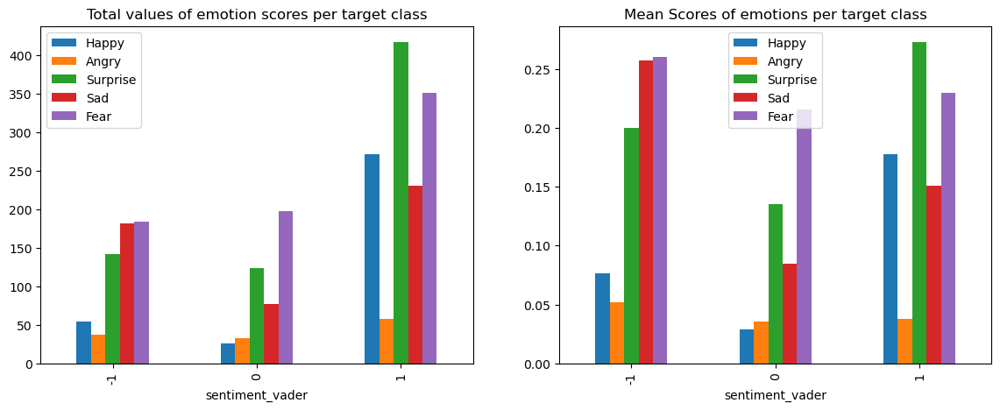

In [175]:
fig, axes = plt.subplots(1,2,figsize=(14,5))
ax1 = total_emotions_before.plot(kind='bar', ax = axes[0])
ax1.set_title('Total values of emotion scores per target class')
ax2 = mean_emotions_before.plot(kind='bar', ax = axes[1])
ax2.set_title('Mean Scores of emotions per target class')
plt.show()

### In the plots above we can see what were the emotions associated with the tweets. It is interesting to notice that about 350 tweets were feared but positive about the upcoming trailer of the movie. What is more the average score of 'Fear' was the highest in two out of three classifications.

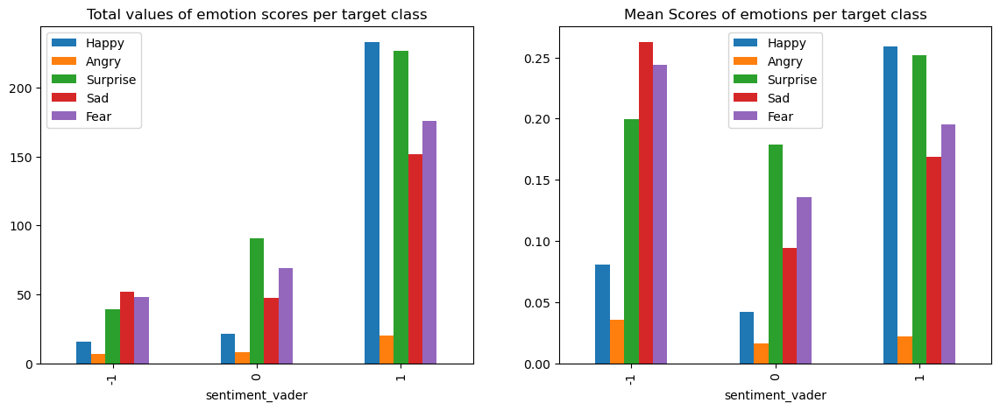

In [176]:
fig, axes = plt.subplots(1,2,figsize=(14,5))
ax1 = total_emotions_trailer.plot(kind='bar', ax = axes[0])
ax1.set_title('Total values of emotion scores per target class')
ax2 = mean_emotions_trailer.plot(kind='bar', ax = axes[1])
ax2.set_title('Mean Scores of emotions per target class')
plt.show()

### It is interesting to notice that after the trailer's premiere more people had happy emotions rather than sad. Also, it is rather nice to see that there weren't many angry opinions.

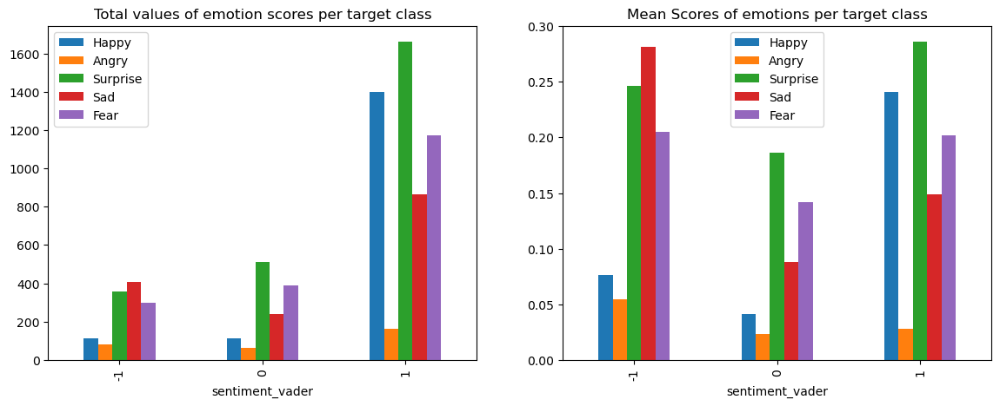

In [177]:
fig, axes = plt.subplots(1,2,figsize=(14,5))
ax1 = total_emotions.plot(kind='bar', ax = axes[0])
ax1.set_title('Total values of emotion scores per target class')
ax2 = mean_emotions.plot(kind='bar', ax = axes[1])
ax2.set_title('Mean Scores of emotions per target class')
plt.show()

### As we can see above people were liked the movie were really surprised and happy with it. However, there were also over 400 people who were sad and gave negative opinions. All in all, the average percentages for Surprise in positive opinions and Sad in negative opinions were more or less the same. The question is: did some people really not like the film or were they sad because it was the last movie of the series?

### The next charts will be interesting for statistics fans. Let's look into the happy and fear emotions and see what was the chance of being a positive, neutral or negative opinion for them.

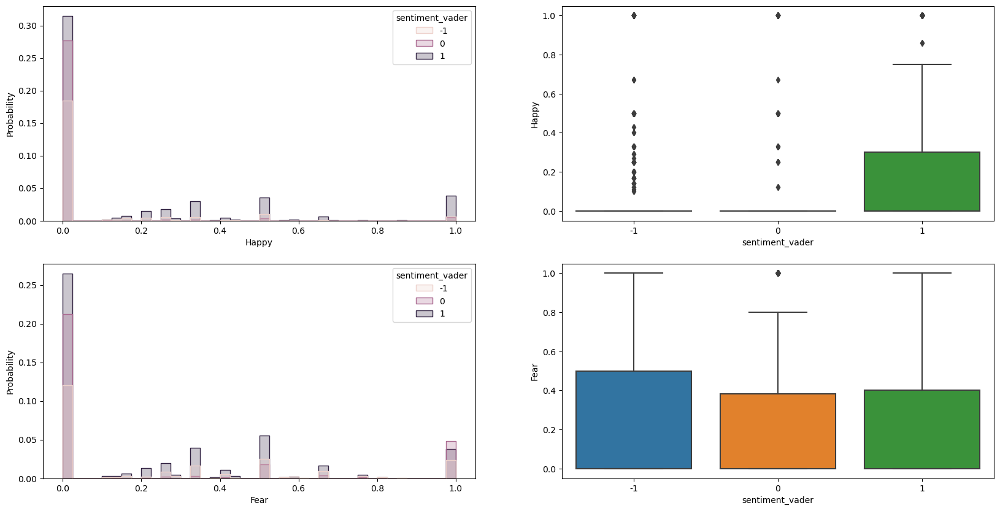

In [178]:
fig, axes = plt.subplots(2,2,figsize=(20,10))
sns.histplot(data = df_before, 
             x = 'Happy',  
             hue = 'sentiment_vader',
             element='step',
             stat='probability',
            bins=40,
            ax=axes[0,0])
sns.boxplot(data = df_before, x = 'sentiment_vader', y = 'Happy',ax=axes[0,1])
sns.histplot(data = df_before, 
             x = 'Fear',  
             hue = 'sentiment_vader',
             element='step',
             stat='probability',
            bins=40,
            ax=axes[1,0])
sns.boxplot(data = df_before, x = 'sentiment_vader', y = 'Fear',ax=axes[1,1])
plt.show()

# It is interesting to see that tweets that out of all tweets the ones which had a Happy score of 0 stood for 30% of the positive tweets. The same with fear but with a 25% total percentage.

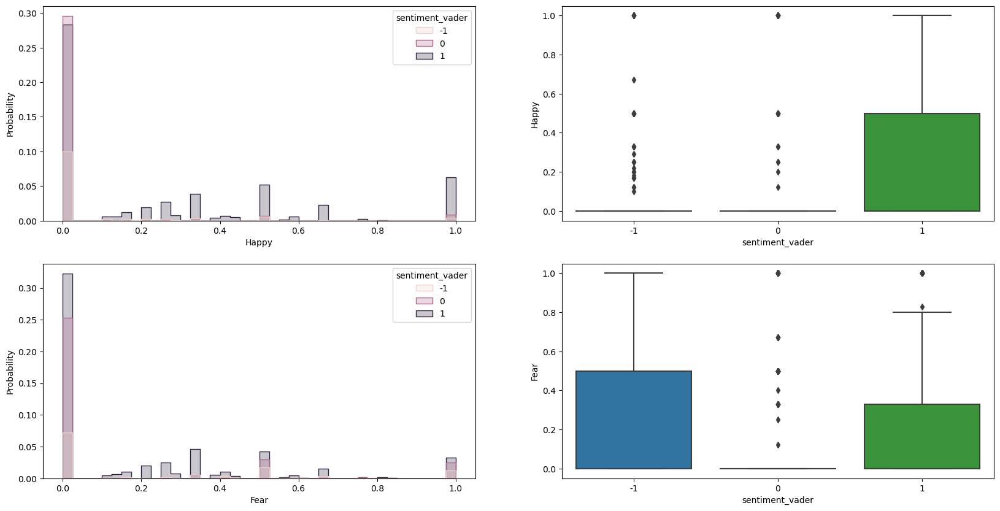

In [179]:
fig, axes = plt.subplots(2,2,figsize=(20,10))
sns.histplot(data = df_trailer, 
             x = 'Happy',  
             hue = 'sentiment_vader',
             element='step',
             stat='probability',
            bins=40,
            ax=axes[0,0])
sns.boxplot(data = df_trailer, x = 'sentiment_vader', y = 'Happy',ax=axes[0,1])
sns.histplot(data = df_trailer, 
             x = 'Fear',  
             hue = 'sentiment_vader',
             element='step',
             stat='probability',
            bins=40,
            ax=axes[1,0])
sns.boxplot(data = df_trailer, x = 'sentiment_vader', y = 'Fear',ax=axes[1,1])
plt.show()

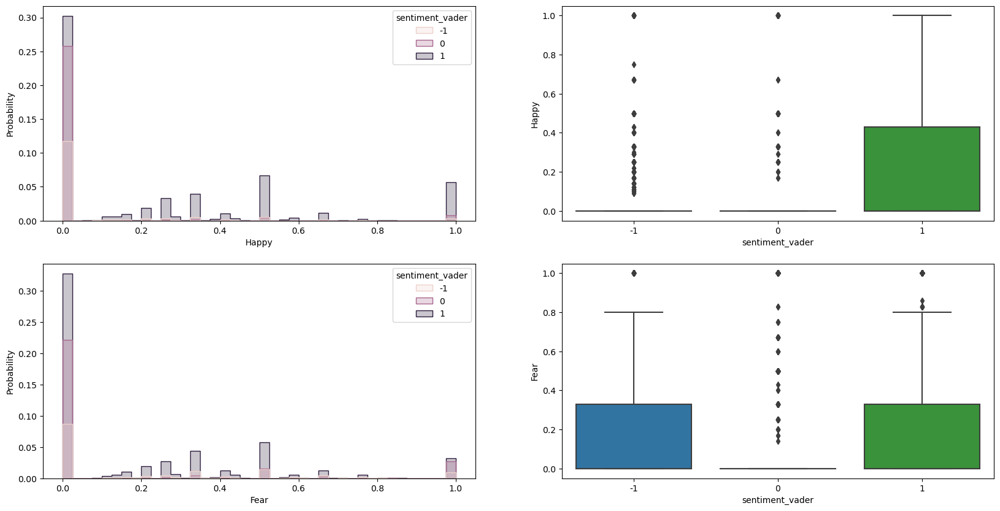

In [180]:
fig, axes = plt.subplots(2,2,figsize=(20,10))
sns.histplot(data = df, 
             x = 'Happy',  
             hue = 'sentiment_vader',
             element='step',
             stat='probability',
            bins=40,
            ax=axes[0,0])
sns.boxplot(data = df, x = 'sentiment_vader', y = 'Happy',ax=axes[0,1])
sns.histplot(data = df, 
             x = 'Fear',  
             hue = 'sentiment_vader',
             element='step',
             stat='probability',
            bins=40,
            ax=axes[1,0])
sns.boxplot(data = df, x = 'sentiment_vader', y = 'Fear',ax=axes[1,1])
plt.show()

### After the movie's trailer had premiered, more people became less feared of the movie and gave positive opinions.

### Let's look into the counts of tweet sentiment for positive, neutral and negative tweets and see how they varied in time. 

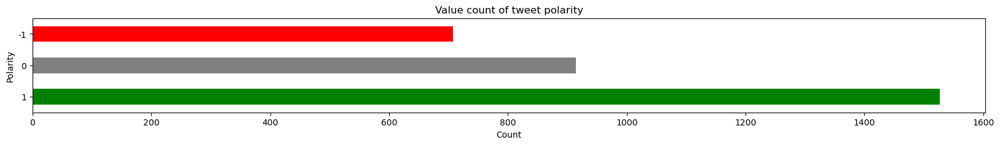

In [181]:
# plot a bar graph to show count of tweet sentiment
fig = plt.figure(figsize=(20,2))
color = ['green','grey','red']
df_before['sentiment_vader'].value_counts().plot(kind='barh',color = color)
plt.title('Value count of tweet polarity')
plt.ylabel('Polarity')
plt.xlabel('Count')
plt.grid(False)
plt.show()

In [240]:
### Before the trailer came out it looks that the amount of positive tweets doubled the amount of the negative tweets.

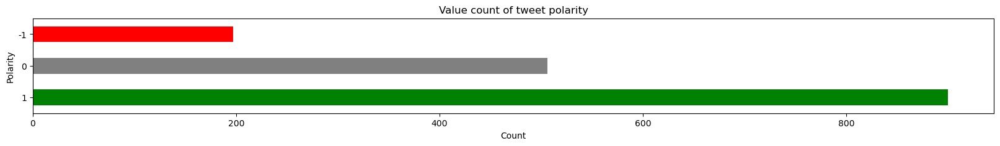

In [182]:
# plot a bar graph to show count of tweet sentiment
fig = plt.figure(figsize=(20,2))
color = ['green','grey','red']
df_trailer['sentiment_vader'].value_counts().plot(kind='barh',color = color)
plt.title('Value count of tweet polarity')
plt.ylabel('Polarity')
plt.xlabel('Count')
plt.grid(False)
plt.show()

### Wow! It looks that after the trailer came out positive tweets quadrupled the amount of negative tweets!

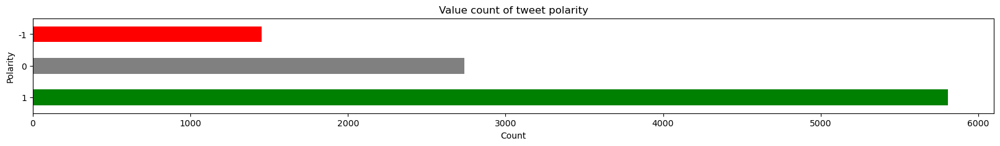

In [183]:
# plot a bar graph to show count of tweet sentiment
fig = plt.figure(figsize=(20,2))
color = ['green','grey','red']
df['sentiment_vader'].value_counts().plot(kind='barh',color = color)
plt.title('Value count of tweet polarity')
plt.ylabel('Polarity')
plt.xlabel('Count')
plt.grid(False)
plt.show()

### After the movie premiered there was a slight decrease in neutral opinions but the positive opinions still quadrupled the amount of the negative opinions. This means that out of 10 random people, 6 liked the movie, 2,5 were neutral and 1,5 were not really fond of it. Let's visualize the percentages using pie charts.

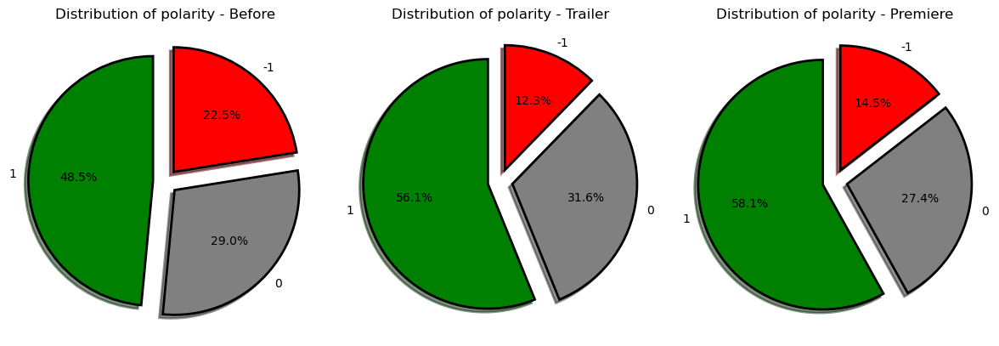

In [186]:
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

dataframes = [df_before, df_trailer, df]
labels = ['Before', 'Trailer', 'Premiere']
colors = ['green', 'grey', 'red']
explode = (0.1, 0.1, 0.1) # distance between slices

for i, ax in enumerate(axes):
    tags = dataframes[i]['sentiment_vader'].value_counts()
    wp = {'linewidth': 2, 'edgecolor': 'black'}
    
    tags.plot(kind='pie', autopct='%1.1f%%', shadow=True, colors=colors,
              startangle=90, wedgeprops=wp, explode=explode, label='', ax=ax)
    
    ax.set_title(f'Distribution of polarity - {labels[i]}')

plt.tight_layout()
plt.show()

### It looks like the pie charts confirm my statement above. Now let's do some wordclouds! I will visualise the words that occured the most for each dataframe and for each type of opinion.

In [187]:
# create a function for wordcloud
def create_wordcloud(text):    
    allWords = ' '.join([tweets for tweets in text])
    wordCloud = WordCloud(background_color='black', width=800, height=500, random_state=21, max_font_size=130).generate(allWords)
    return wordCloud.to_array()

In [188]:
# wordcloud for positive tweets for the df_before
posTweets_before = df_before.loc[df_before['sentiment_vader']==1, 'cleanedTweets']
posWordCloud_before = create_wordcloud(posTweets_before)

# wordcloud for neutral tweets
neutralTweets_before = df_before.loc[df_before['sentiment_vader']==0, 'cleanedTweets']
neutralWordCloud_before = create_wordcloud(neutralTweets_before)

# wordcloud for negative tweets
negTweets_before = df_before.loc[df_before['sentiment_vader']==-1, 'cleanedTweets']
negWordCloud_before = create_wordcloud(negTweets_before)

In [189]:
# wordcloud for positive tweets for the df_trailer
posTweets_trailer = df_trailer.loc[df_trailer['sentiment_vader']==1, 'cleanedTweets']
posWordCloud_trailer = create_wordcloud(posTweets_trailer)

# wordcloud for neutral tweets
neutralTweets_trailer = df_trailer.loc[df_trailer['sentiment_vader']==0, 'cleanedTweets']
neutralWordCloud_trailer = create_wordcloud(neutralTweets_trailer)

# wordcloud for negative tweets
negTweets_trailer = df_trailer.loc[df_trailer['sentiment_vader']==-1, 'cleanedTweets']
negWordCloud_trailer = create_wordcloud(negTweets_trailer)

In [190]:
# wordcloud for positive tweets
posTweets = df.loc[df['sentiment_vader']==1, 'cleanedTweets']
posWordCloud = create_wordcloud(posTweets)

# wordcloud for neutral tweets
neutralTweets = df.loc[df['sentiment_vader']==0, 'cleanedTweets']
neutralWordCloud = create_wordcloud(neutralTweets)

# wordcloud for negative tweets
negTweets = df.loc[df['sentiment_vader']==-1, 'cleanedTweets']
negWordCloud = create_wordcloud(negTweets)

### Let's start with the tweets before the trailer's premiere.

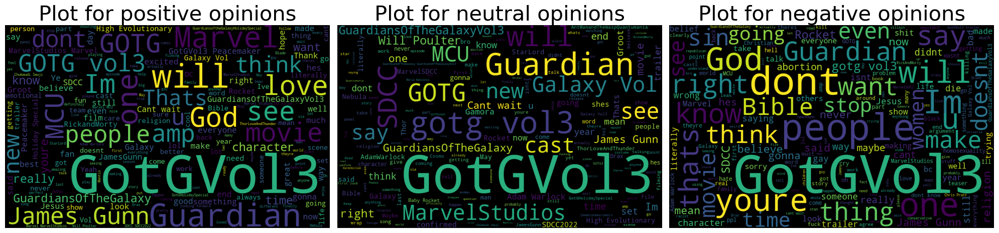

In [191]:
# Plots for df_before
plt.figure(figsize=(20, 10))
plt.subplot(1, 3, 1)
plt.imshow(posWordCloud_before)
plt.title("Plot for positive opinions", size = 30)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(neutralWordCloud_before)
plt.title("Plot for neutral opinions", size = 30)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(negWordCloud_before)
plt.title("Plot for negative opinions", size = 30)
plt.axis('off')
plt.tight_layout()
plt.show()

### Most of the words are associated with the movie's title. It is interesting to see the word 'Bible' in the plot for negative opinions. Maybe religuous people weren't really waiting for the movie's premiere? Well that is definitely not the case because the word 'God' appears in both the positive opinions and the negative ones.

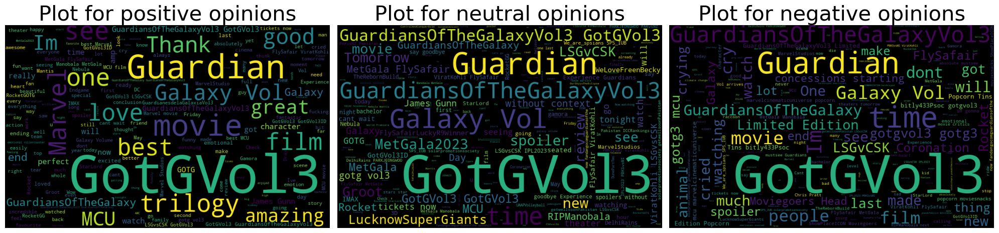

In [192]:
# Plots for df_trailer
plt.figure(figsize=(20, 10))
plt.subplot(1, 3, 1)
plt.imshow(posWordCloud_trailer)
plt.title("Plot for positive opinions", size = 30)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(neutralWordCloud_trailer)
plt.title("Plot for neutral opinions", size = 30)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(negWordCloud_trailer)
plt.title("Plot for negative opinions", size = 30)
plt.axis('off')
plt.tight_layout()
plt.show()

###  It looks like most people thought the trailer was amazing. I didn't think I would see "MetGala2023" in neutral opinions.

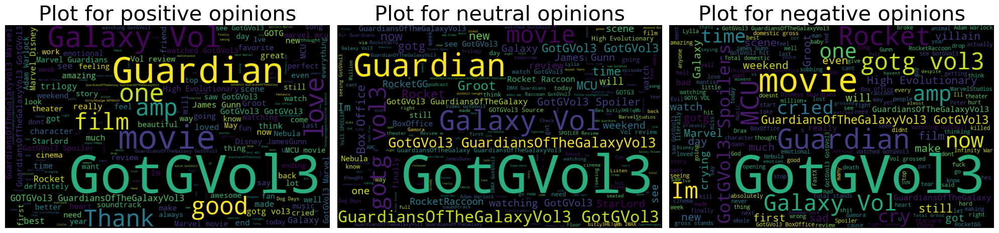

In [193]:
# Plots for df
plt.figure(figsize=(20, 10))
plt.subplot(1, 3, 1)
plt.imshow(posWordCloud)
plt.title("Plot for positive opinions", size = 30)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(neutralWordCloud)
plt.title("Plot for neutral opinions", size = 30)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(negWordCloud)
plt.title("Plot for negative opinions", size = 30)
plt.axis('off')
plt.tight_layout()
plt.show()

### It seems that many people who gave negative opinions cried. Did they cry because the movie was so good or weren't they happy with the ending and didn't want to let go of their favourite heroes?

### Below I will check which emotion had the highest score and take that emotion into a new column called MaxEmotion.

In [194]:
def get_max_emotion(row):
    selected_columns = ['Happy', 'Angry', 'Surprise', 'Sad', 'Fear']
    numeric_values = row[selected_columns].apply(pd.to_numeric, errors='coerce')
    max_emotion = numeric_values.idxmax()
    if max_emotion == 'Happy':
        return 1
    elif max_emotion == 'Angry':
        return 2
    elif max_emotion == 'Surprise':
        return 3
    elif max_emotion == 'Sad':
        return 4
    elif max_emotion == 'Fear':
        return 5

df_before['MaxEmotion'] = df_before.apply(get_max_emotion, axis=1)
df_trailer['MaxEmotion'] = df_trailer.apply(get_max_emotion, axis=1)
df['MaxEmotion'] = df.apply(get_max_emotion, axis=1)
df['MaxEmotion'].value_counts() # sample counts for df

1    4423
3    2653
5    1329
4    1266
2     329
Name: MaxEmotion, dtype: int64

### We can see that 'happy' stood for nearly half of the emotions after the movie's premiere. Let's look into the wordclouds for each emotion.

In [195]:
# wordcloud for Happy tweets
happyTweets_before = df_before.loc[df_before['MaxEmotion']== 1, 'cleanedTweets']
happyWordCloud_before = create_wordcloud(happyTweets_before)

# wordcloud for Angry tweets
angryTweets_before = df_before.loc[df_before['MaxEmotion']== 2, 'cleanedTweets']
angryWordCloud_before = create_wordcloud(angryTweets_before)

# wordcloud for Surprised tweets
surprisedTweets_before = df_before.loc[df_before['MaxEmotion']== 3, 'cleanedTweets']
surprisedWordCloud_before = create_wordcloud(surprisedTweets_before)

# wordcloud for Sad tweets
sadTweets_before = df_before.loc[df_before['MaxEmotion']== 4, 'cleanedTweets']
sadWordCloud_before = create_wordcloud(sadTweets_before)

# wordcloud for Fear tweets
fearTweets_before = df_before.loc[df_before['MaxEmotion']== 5, 'cleanedTweets']
fearWordCloud_before = create_wordcloud(fearTweets_before)

In [196]:
# wordcloud for Happy tweets
happyTweets_trailer = df_trailer.loc[df_trailer['MaxEmotion']== 1, 'cleanedTweets']
happyWordCloud_trailer = create_wordcloud(happyTweets_trailer)

# wordcloud for Angry tweets
angryTweets_trailer = df_trailer.loc[df_trailer['MaxEmotion']== 2, 'cleanedTweets']
angryWordCloud_trailer = create_wordcloud(angryTweets_trailer)

# wordcloud for Surprised tweets
surprisedTweets_trailer = df_trailer.loc[df_trailer['MaxEmotion']== 3, 'cleanedTweets']
surprisedWordCloud_trailer = create_wordcloud(surprisedTweets_trailer)

# wordcloud for Sad tweets
sadTweets_trailer = df_trailer.loc[df_trailer['MaxEmotion']== 4, 'cleanedTweets']
sadWordCloud_trailer = create_wordcloud(sadTweets_trailer)

# wordcloud for Fear tweets
fearTweets_trailer = df_trailer.loc[df_trailer['MaxEmotion']== 5, 'cleanedTweets']
fearWordCloud_trailer = create_wordcloud(fearTweets_trailer)

In [197]:
# wordcloud for Happy tweets
happyTweets = df.loc[df['MaxEmotion']== 1, 'cleanedTweets']
happyWordCloud = create_wordcloud(happyTweets)

# wordcloud for Angry tweets
angryTweets = df.loc[df['MaxEmotion']== 2, 'cleanedTweets']
angryWordCloud = create_wordcloud(angryTweets)

# wordcloud for Surprised tweets
surprisedTweets = df.loc[df['MaxEmotion']== 3, 'cleanedTweets']
surprisedWordCloud = create_wordcloud(surprisedTweets)

# wordcloud for Sad tweets
sadTweets = df.loc[df['MaxEmotion']== 4, 'cleanedTweets']
sadWordCloud = create_wordcloud(sadTweets)

# wordcloud for Fear tweets
fearTweets = df.loc[df['MaxEmotion']== 5, 'cleanedTweets']
fearWordCloud = create_wordcloud(fearTweets)

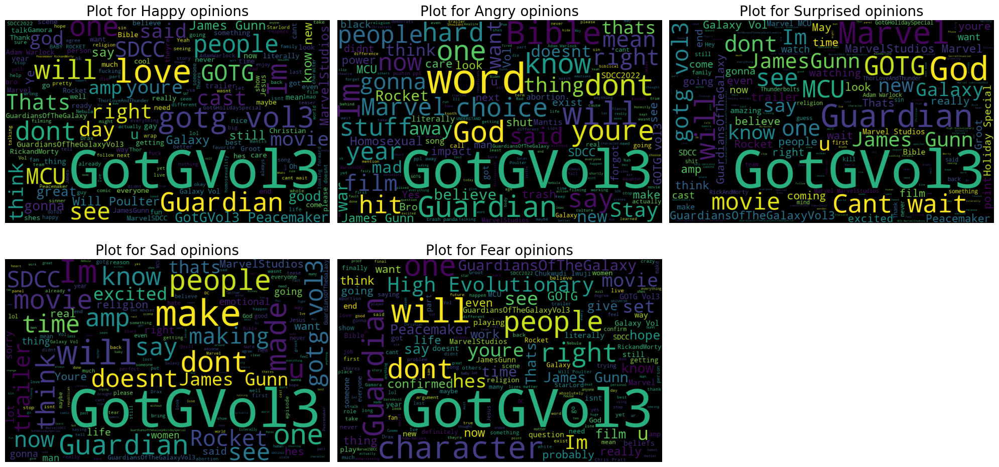

In [198]:
plt.figure(figsize=(20, 10))

plt.subplot(2, 3, 1)
plt.imshow(happyWordCloud_before)
plt.title("Plot for Happy opinions", size=20)
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(angryWordCloud_before)
plt.title("Plot for Angry opinions", size=20)
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(surprisedWordCloud_before)
plt.title("Plot for Surprised opinions", size=20)
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(sadWordCloud_before)
plt.title("Plot for Sad opinions", size=20)
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(fearWordCloud_before)
plt.title("Plot for Fear opinions", size=20)
plt.axis('off')

plt.tight_layout()
plt.show()

### It looks like people were as much surprised before the movie as am I with the word 'God' appearing in their opinions!

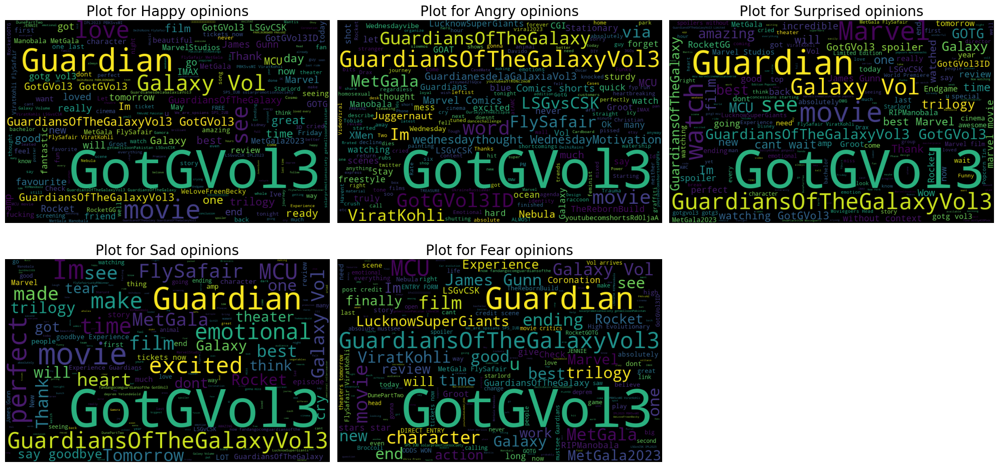

In [199]:
plt.figure(figsize=(20, 10))

plt.subplot(2, 3, 1)
plt.imshow(happyWordCloud_trailer)
plt.title("Plot for Happy opinions", size=20)
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(angryWordCloud_trailer)
plt.title("Plot for Angry opinions", size=20)
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(surprisedWordCloud_trailer)
plt.title("Plot for Surprised opinions", size=20)
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(sadWordCloud_trailer)
plt.title("Plot for Sad opinions", size=20)
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(fearWordCloud_trailer)
plt.title("Plot for Fear opinions", size=20)
plt.axis('off')

plt.tight_layout()
plt.show()

### It is interesting to see that people who were sad after the trailer's premiere really often used the word 'perfect' and 'excited'.

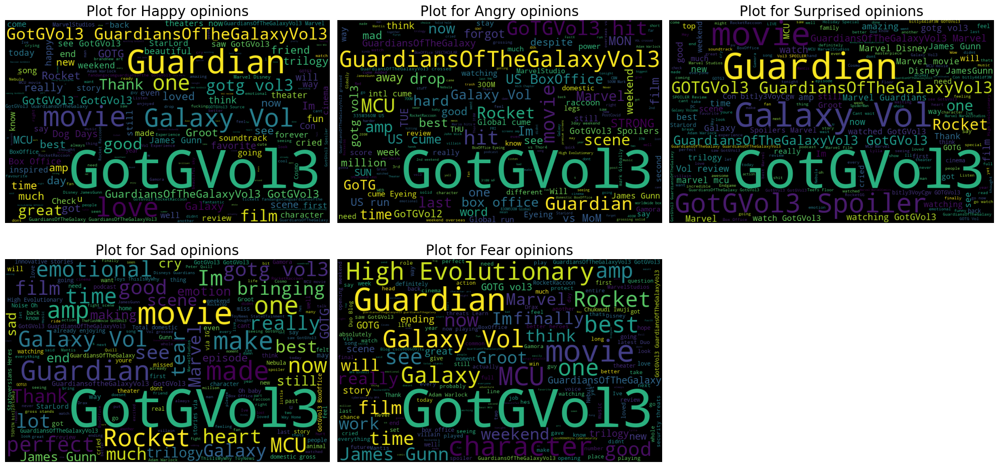

In [200]:
plt.figure(figsize=(20, 10))

plt.subplot(2, 3, 1)
plt.imshow(happyWordCloud)
plt.title("Plot for Happy opinions", size=20)
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(angryWordCloud)
plt.title("Plot for Angry opinions", size=20)
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(surprisedWordCloud)
plt.title("Plot for Surprised opinions", size=20)
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(sadWordCloud)
plt.title("Plot for Sad opinions", size=20)
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(fearWordCloud)
plt.title("Plot for Fear opinions", size=20)
plt.axis('off')

plt.tight_layout()
plt.show()

### It seems that many people feared the 'High Evolutionary' who was the main villain of the movie and were afraid of something happening to the character Rocket.

### Let's visualise the most popular words for positive, neutral and negative opinions.

In [201]:
def tokenize_and_count_words(text):
    # Break each sentence into words
    sentences = []
    for word in text:
        sentences.append(word)
    sentences

    lines = list()
    for line in sentences:
        words = line.split()
        for w in words:
            lines.append(w)
    # lines[:10] #shows first 10 words in the first tweet

    # Tokenize the words
    tokens = [word_tokenize(word.lower()) for word in lines]

    # Flatten the list of tokens
    tokens = [token for sublist in tokens for token in sublist]

    # Create a new dataframe for the stem and show the count of the most used words
    df_stem = pd.DataFrame(tokens)
    df_stem = df_stem[0].value_counts()
    return df_stem

In [202]:
# Applying the function.
df_pos_before = tokenize_and_count_words(df_before.loc[df_before['sentiment_vader'] == 1, 'reviewText'])
df_neu_before = tokenize_and_count_words(df_before.loc[df_before['sentiment_vader'] == 0, 'reviewText'])
df_neg_before = tokenize_and_count_words(df_before.loc[df_before['sentiment_vader'] == -1, 'reviewText'])

df_happy_before = tokenize_and_count_words(df_before.loc[df_before['MaxEmotion'] == 1, 'reviewText'])
df_angry_before = tokenize_and_count_words(df_before.loc[df_before['MaxEmotion'] == 2, 'reviewText'])
df_surprised_before = tokenize_and_count_words(df_before.loc[df_before['MaxEmotion'] == 3, 'reviewText'])
df_sad_before = tokenize_and_count_words(df_before.loc[df_before['MaxEmotion'] == 4, 'reviewText'])
df_fear_before = tokenize_and_count_words(df_before.loc[df_before['MaxEmotion'] == 5, 'reviewText'])

In [203]:
# Applying the function.
df_pos_trailer = tokenize_and_count_words(df_trailer.loc[df_trailer['sentiment_vader'] == 1, 'reviewText'])
df_neu_trailer = tokenize_and_count_words(df_trailer.loc[df_trailer['sentiment_vader'] == 0, 'reviewText'])
df_neg_trailer = tokenize_and_count_words(df_trailer.loc[df_trailer['sentiment_vader'] == -1, 'reviewText'])

df_happy_trailer = tokenize_and_count_words(df_trailer.loc[df_trailer['MaxEmotion'] == 1, 'reviewText'])
df_angry_trailer = tokenize_and_count_words(df_trailer.loc[df_trailer['MaxEmotion'] == 2, 'reviewText'])
df_surprised_trailer = tokenize_and_count_words(df_trailer.loc[df_trailer['MaxEmotion'] == 3, 'reviewText'])
df_sad_trailer = tokenize_and_count_words(df_trailer.loc[df_trailer['MaxEmotion'] == 4, 'reviewText'])
df_fear_trailer = tokenize_and_count_words(df_trailer.loc[df_trailer['MaxEmotion'] == 5, 'reviewText'])

In [204]:
# Applying the function.
df_pos = tokenize_and_count_words(df.loc[df['sentiment_vader'] == 1, 'reviewText'])
df_neu = tokenize_and_count_words(df.loc[df['sentiment_vader'] == 0, 'reviewText'])
df_neg = tokenize_and_count_words(df.loc[df['sentiment_vader'] == -1, 'reviewText'])

df_happy = tokenize_and_count_words(df.loc[df['MaxEmotion'] == 1, 'reviewText'])
df_angry = tokenize_and_count_words(df.loc[df['MaxEmotion'] == 2, 'reviewText'])
df_surprised = tokenize_and_count_words(df.loc[df['MaxEmotion'] == 3, 'reviewText'])
df_sad = tokenize_and_count_words(df.loc[df['MaxEmotion'] == 4, 'reviewText'])
df_fear = tokenize_and_count_words(df.loc[df['MaxEmotion'] == 5, 'reviewText'])

### Below I will do the plots but I will display only the 20  most frequent words.

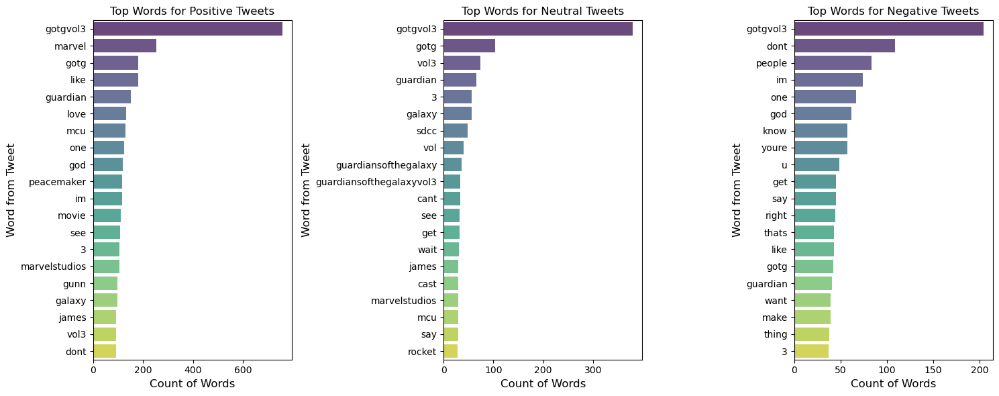

In [205]:
# Plotting top 20 words for positive tweets
df_pos_before = df_pos_before[:20]
plt.figure(figsize=(15, 6))

plt.subplot(1, 3, 1)
sns.barplot(x=df_pos_before.values, y=df_pos_before.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Positive Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

# Plotting top 20 words for neutral tweets
df_neu_before = df_neu_before[:20]
plt.subplot(1, 3, 2)
sns.barplot(x=df_neu_before.values, y=df_neu_before.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Neutral Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

# Plotting top 20 words for negative tweets
df_neg_before = df_neg_before[:20]
plt.subplot(1, 3, 3)
sns.barplot(x=df_neg_before.values, y=df_neg_before.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Negative Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

plt.tight_layout()
plt.show()

### Most of the popular words are related to the movie's title, trilogy and director.

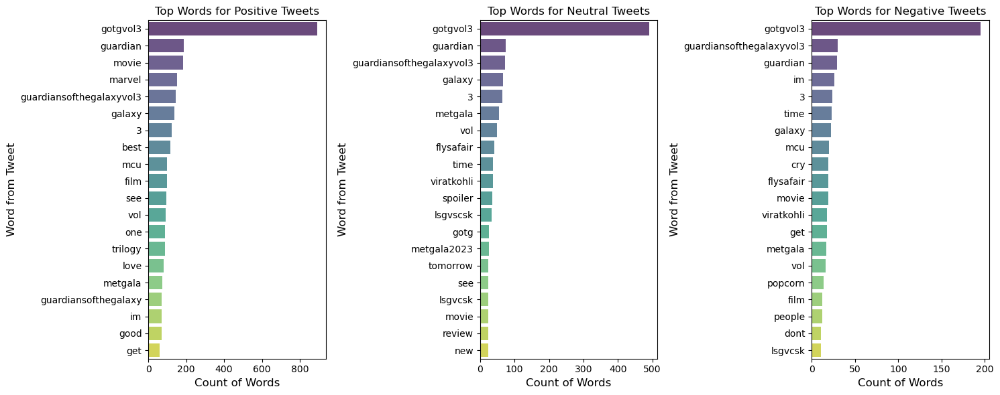

In [206]:
# Plotting top 20 words for positive tweets
df_pos_trailer = df_pos_trailer[:20]
plt.figure(figsize=(15, 6))

plt.subplot(1, 3, 1)
sns.barplot(x=df_pos_trailer.values, y=df_pos_trailer.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Positive Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

# Plotting top 20 words for neutral tweets
df_neu_trailer = df_neu_trailer[:20]
plt.subplot(1, 3, 2)
sns.barplot(x=df_neu_trailer.values, y=df_neu_trailer.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Neutral Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

# Plotting top 20 words for negative tweets
df_neg_trailer = df_neg_trailer[:20]
plt.subplot(1, 3, 3)
sns.barplot(x=df_neg_trailer.values, y=df_neg_trailer.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Negative Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

plt.tight_layout()
plt.show()

### I am wondering why did over 100 people tweet neutral opinions using the word Metgala?

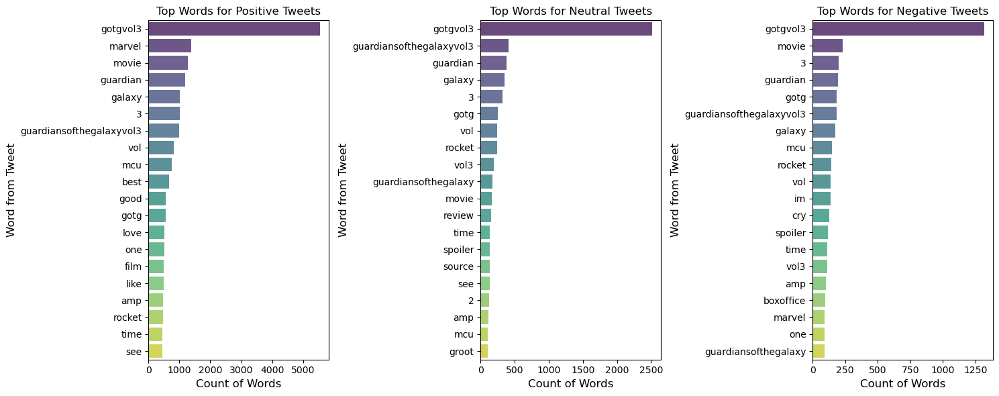

In [207]:
# Plotting top 20 words for positive tweets
df_pos = df_pos[:20]
plt.figure(figsize=(15, 6))

plt.subplot(1, 3, 1)
sns.barplot(x=df_pos.values, y=df_pos.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Positive Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

# Plotting top 20 words for neutral tweets
df_neu = df_neu[:20]
plt.subplot(1, 3, 2)
sns.barplot(x=df_neu.values, y=df_neu.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Neutral Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

# Plotting top 20 words for negative tweets
df_neg = df_neg[:20]
plt.subplot(1, 3, 3)
sns.barplot(x=df_neg.values, y=df_neg.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Negative Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

plt.tight_layout()
plt.show()

### Seems that Rocket was played well as he is the reason behind many positive, neutral and negative opinions. Let's see the most popular words with their worldclouds.

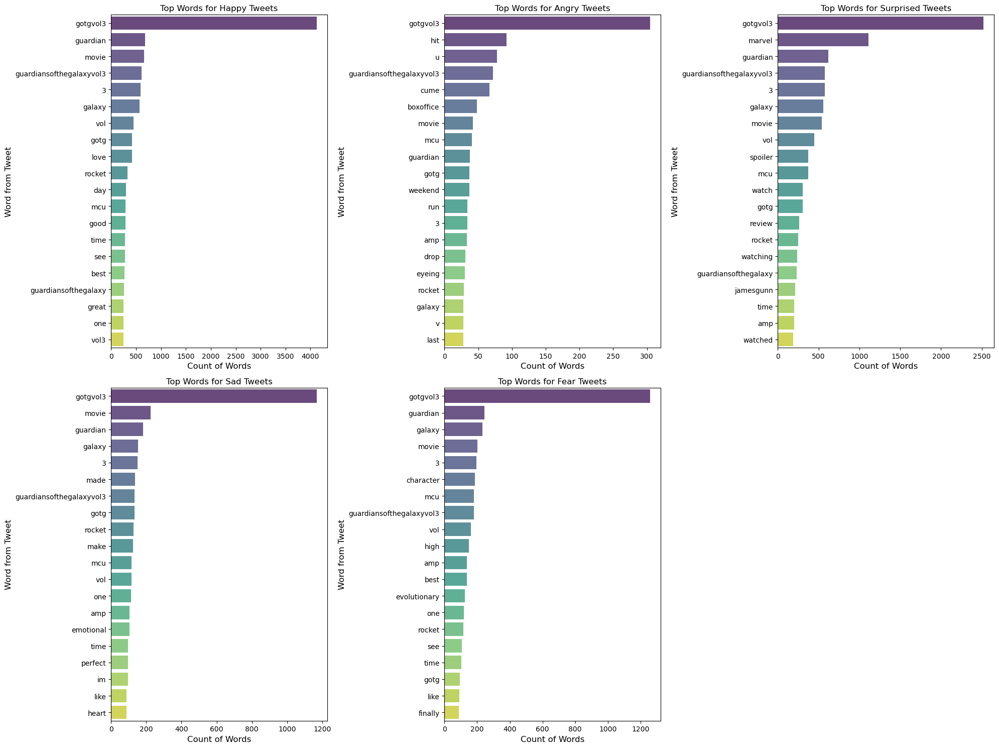

In [109]:
plt.figure(figsize=(20, 15))

# Plotting top 20 words for Happy tweets
df_happy_before = df_happy_before[:20]
plt.subplot(2, 3, 1)
sns.barplot(x=df_happy_before.values, y=df_happy_before.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Happy Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

# Plotting top 20 words for Angry tweets
df_angry_before = df_angry_before[:20]
plt.subplot(2, 3, 2)
sns.barplot(x=df_angry_before.values, y=df_angry_before.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Angry Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

# Plotting top 20 words for Surprised tweets
df_surprised_before = df_surprised_before[:20]
plt.subplot(2, 3, 3)
sns.barplot(x=df_surprised_before.values, y=df_surprised_before.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Surprised Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

# Plotting top 20 words for Sad tweets
df_sad_before = df_sad_before[:20]
plt.subplot(2, 3, 4)
sns.barplot(x=df_sad_before.values, y=df_sad_before.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Sad Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

# Plotting top 20 words for Fear tweets
df_fear_before = df_fear_before[:20]
plt.subplot(2, 3, 5)
sns.barplot(x=df_fear_before.values, y=df_fear_before.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Fear Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

plt.tight_layout()
plt.show()

### Before the trailer appeared most of the words were related to the film. 

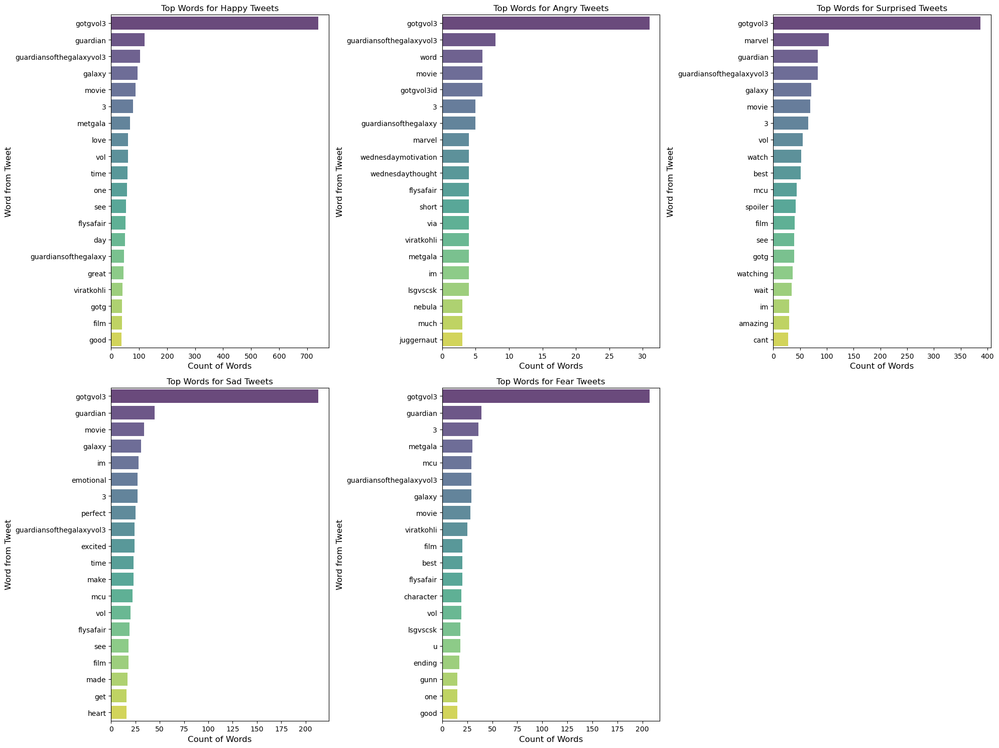

In [208]:
plt.figure(figsize=(20, 15))

# Plotting top 20 words for Happy tweets
df_happy_trailer = df_happy_trailer[:20]
plt.subplot(2, 3, 1)
sns.barplot(x=df_happy_trailer.values, y=df_happy_trailer.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Happy Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

# Plotting top 20 words for Angry tweets
df_angry_trailer = df_angry_trailer[:20]
plt.subplot(2, 3, 2)
sns.barplot(x=df_angry_trailer.values, y=df_angry_trailer.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Angry Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

# Plotting top 20 words for Surprised tweets
df_surprised_trailer = df_surprised_trailer[:20]
plt.subplot(2, 3, 3)
sns.barplot(x=df_surprised_trailer.values, y=df_surprised_trailer.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Surprised Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

# Plotting top 20 words for Sad tweets
df_sad_trailer = df_sad_trailer[:20]
plt.subplot(2, 3, 4)
sns.barplot(x=df_sad_trailer.values, y=df_sad_trailer.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Sad Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

# Plotting top 20 words for Fear tweets
df_fear_trailer = df_fear_trailer[:20]
plt.subplot(2, 3, 5)
sns.barplot(x=df_fear_trailer.values, y=df_fear_trailer.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Fear Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

plt.tight_layout()
plt.show()

### It seems a lot of people liked the trailer. It is interesting to see that people who were classified as angry tweeted using the words 'wednesday motivation'.

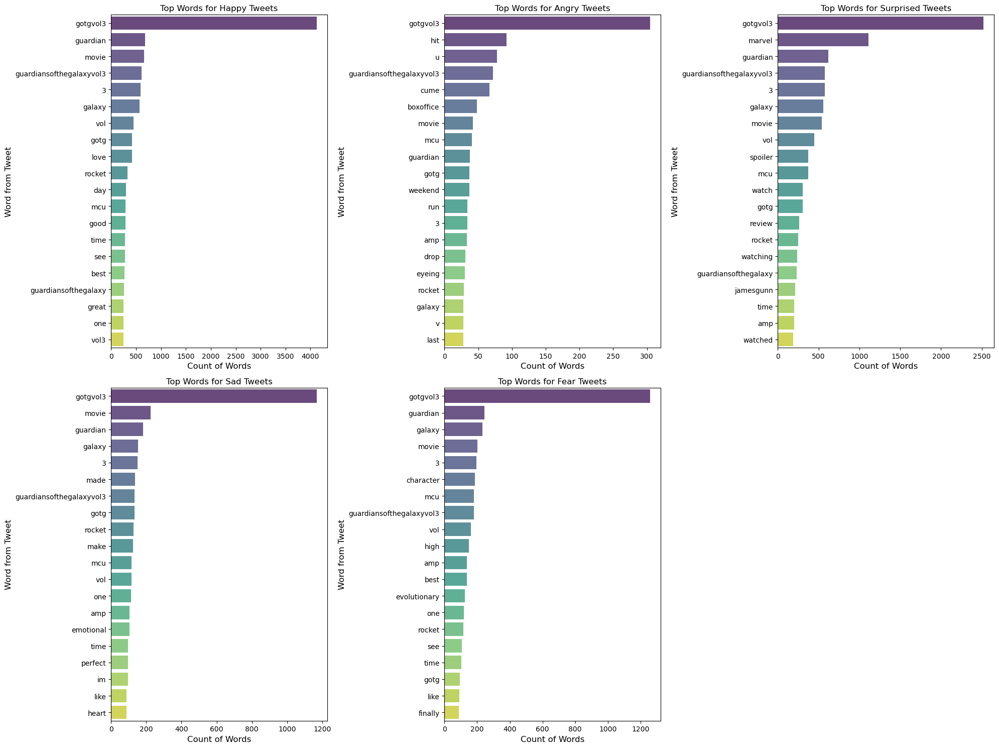

In [209]:
plt.figure(figsize=(20, 15))

# Plotting top 20 words for Happy tweets
df_happy = df_happy[:20]
plt.subplot(2, 3, 1)
sns.barplot(x=df_happy.values, y=df_happy.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Happy Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

# Plotting top 20 words for Angry tweets
df_angry = df_angry[:20]
plt.subplot(2, 3, 2)
sns.barplot(x=df_angry.values, y=df_angry.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Angry Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

# Plotting top 20 words for Surprised tweets
df_surprised = df_surprised[:20]
plt.subplot(2, 3, 3)
sns.barplot(x=df_surprised.values, y=df_surprised.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Surprised Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

# Plotting top 20 words for Sad tweets
df_sad = df_sad[:20]
plt.subplot(2, 3, 4)
sns.barplot(x=df_sad.values, y=df_sad.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Sad Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

# Plotting top 20 words for Fear tweets
df_fear = df_fear[:20]
plt.subplot(2, 3, 5)
sns.barplot(x=df_fear.values, y=df_fear.index, alpha=0.8, palette='viridis')
plt.title('Top Words for Fear Tweets')
plt.xlabel('Count of Words', fontsize=12)
plt.ylabel('Word from Tweet', fontsize=12)

plt.tight_layout()
plt.show()

### Rocket seems to be one really controversial hero. 

### Let's see how the emotions changed in time.

In [210]:
df_before['date'] = pd.to_datetime(df_before['date'])
df_trailer['date'] = pd.to_datetime(df_trailer['date'])
df['date'] = pd.to_datetime(df['date'])
columns_to_average = ['Happy', 'Angry', 'Surprise', 'Sad', 'Fear']
for column in columns_to_average:
    df_before[f'{column}_avg'] = df_before.groupby(df_before['date'].dt.date)[column].transform('mean')
    df_trailer[f'{column}_avg'] = df_trailer.groupby(df_trailer['date'].dt.date)[column].transform('mean')
    df[f'{column}_avg'] = df.groupby(df['date'].dt.date)[column].transform('mean')

In [211]:
# Plotting the average values over time

fig = px.line(df_before, x='date', y=['Happy_avg', 'Angry_avg', 'Surprise_avg', 'Sad_avg', 'Fear_avg'],
              labels={'value': 'Average Value', 'date': 'Date'}, title='Average Values of Emotions Over Time')

fig.show()

### Well the emotions really remind me of our heartbeat. It seems there was a lot of ups and downs before the trailer's premiere.

In [252]:
df_trailer['date'].value_counts()

2023-05-03    1603
Name: date, dtype: int64

### Unfortunately, as we can see all of the tweets that appeared after the trailer premiered were actually a day before the movie's premiere. We cannot see how it changed in time as we don't have the data for any other days. The below plot will only give us a point of data for each emotion.

In [214]:
# Plotting the average values over time

fig = px.line(df_trailer, x='date', y=['Happy_avg', 'Angry_avg', 'Surprise_avg', 'Sad_avg', 'Fear_avg'],
              labels={'value': 'Average Value', 'date': 'Date'}, title='Average Values of Emotions Over Time')

fig.show()

### Let's see the emotions after the movie's premiere.

In [213]:
# Plotting the average values over time

fig = px.line(df, x='date', y=['Happy_avg', 'Angry_avg', 'Surprise_avg', 'Sad_avg', 'Fear_avg'],
              labels={'value': 'Average Value', 'date': 'Date'}, title='Average Values of Emotions Over Time')

fig.show()

### Thanks to plotly's interactive interface we can see that the emotion that had the highest average score per day was surprise. It is good to see that angry had the smallest average score.

### To wrap up the project I would like to visualise the opinions on a world map. Unfortunately, we only have coordinates and not the country name.

In [230]:
# Create a map centered on a specific location
map_center = [33.704538, -100.668404]
map_opinions_before = folium.Map(location=map_center, zoom_start=10)

# Iterate over the dataframe rows
for index, row in df_before.iterrows():
    # Get the coordinates for each tweet
    coordinates = row['coordinates']
    max_emotion = row['MaxEmotion']  # Get the value in the MaxEmotion column
    
    try:
        # Check if coordinates are available
        if coordinates is not None:
            longitude = coordinates['longitude']
            latitude = coordinates['latitude']
            
            # Set the label based on MaxEmotion value
            if max_emotion == 1:
                label = f"The highest emotion was Happy and its value was equal to: {row['Happy']}"
            elif max_emotion == 2:
                label = f"The highest emotion was Angry and its value was equal to: {row['Angry']}"
            elif max_emotion == 3:
                label = f"The highest emotion was Surprise and its value was equal to: {row['Surprise']}"
            elif max_emotion == 4:
                label = f"The highest emotion was Sad and its value was equal to: {row['Sad']}"
            elif max_emotion == 5:
                label = f"The highest emotion was Fear and its value was equal to: {row['Fear']}"
            else:
                label = "Unknown"
            
            # Create a marker for each tweet location
            folium.Marker(
                location=[latitude, longitude],
                popup=folium.Popup(label, max_width=150, min_width=150),
                icon=folium.Icon(),
            ).add_to(map_opinions_before)
    
    except TypeError:
        # Handle the 'NoneType' object is not subscriptable error
        continue

# Display the map
map_opinions_before

### It is interesting to see that someone in Chile was sad about the movie even before the trailer's premiere.

In [231]:
# Create a map centered on a specific location
map_center = [33.704538, -100.668404]
map_opinions_trailer = folium.Map(location=map_center, zoom_start=10)

# Iterate over the dataframe rows
for index, row in df_trailer.iterrows():
    # Get the coordinates for each tweet
    coordinates = row['coordinates']
    max_emotion = row['MaxEmotion']  # Get the value in the MaxEmotion column
    
    try:
        # Check if coordinates are available
        if coordinates is not None:
            longitude = coordinates['longitude']
            latitude = coordinates['latitude']
            
            # Set the label based on MaxEmotion value
            if max_emotion == 1:
                label = f"The highest emotion was Happy and its value was equal to: {row['Happy']}"
            elif max_emotion == 2:
                label = f"The highest emotion was Angry and its value was equal to: {row['Angry']}"
            elif max_emotion == 3:
                label = f"The highest emotion was Surprise and its value was equal to: {row['Surprise']}"
            elif max_emotion == 4:
                label = f"The highest emotion was Sad and its value was equal to: {row['Sad']}"
            elif max_emotion == 5:
                label = f"The highest emotion was Fear and its value was equal to: {row['Fear']}"
            else:
                label = "Unknown"
            
            # Create a marker for each tweet location
            folium.Marker(
                location=[latitude, longitude],
                popup=folium.Popup(label, max_width=150, min_width=150),
                icon=folium.Icon(),
            ).add_to(map_opinions_trailer)
    
    except TypeError:
        # Handle the 'NoneType' object is not subscriptable error
        continue

# Display the map
map_opinions_trailer

### It seems that no one region thought the same about the trailer. Nearly each opinion in the same country is different.

In [232]:
# Create a map centered on a specific location
map_center = [33.704538, -100.668404]
map_opinions = folium.Map(location=map_center, zoom_start=10)

# Iterate over the dataframe rows
for index, row in df.iterrows():
    # Get the coordinates for each tweet
    coordinates = row['coordinates']
    max_emotion = row['MaxEmotion']  # Get the value in the MaxEmotion column
    
    try:
        # Check if coordinates are available
        if coordinates is not None:
            longitude = coordinates['longitude']
            latitude = coordinates['latitude']
            
            # Set the label based on MaxEmotion value
            if max_emotion == 1:
                label = f"The highest emotion was Happy and its value was equal to: {row['Happy']}"
            elif max_emotion == 2:
                label = f"The highest emotion was Angry and its value was equal to: {row['Angry']}"
            elif max_emotion == 3:
                label = f"The highest emotion was Surprise and its value was equal to: {row['Surprise']}"
            elif max_emotion == 4:
                label = f"The highest emotion was Sad and its value was equal to: {row['Sad']}"
            elif max_emotion == 5:
                label = f"The highest emotion was Fear and its value was equal to: {row['Fear']}"
            else:
                label = "Unknown"
            
            # Create a marker for each tweet location
            folium.Marker(
                location=[latitude, longitude],
                popup=folium.Popup(label, max_width=150, min_width=150),
                icon=folium.Icon(),
            ).add_to(map_opinions)
    
    except TypeError:
        # Handle the 'NoneType' object is not subscriptable error
        continue

# Display the map
map_opinions

### All in all, the movie made people feel happy in Europe and Asia. Some people in Africa and South America were surprised with the outcome. People in Australia felt rather feared about it after the premiere. And the USA? Well it seems americans could not decide on one single emotion.